In [4]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
from scipy.stats import pearsonr
import seaborn as sns
import HERGAST
import torch
import torch.nn as nn
import torch.optim as optim
import anndata as ad
from tqdm import tqdm
import time
from scipy.stats import rankdata
import random
import STAGATE_pyG
def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True 
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.benchmark = False

plt.rcParams["figure.figsize"] = (9, 8)

# helper functions
def plot_gene_dist(adata,i,layer=None,num_bin=30,save=None):

    if layer is not None:
        df = pd.DataFrame({'value':adata.layers[layer][:,i],'mark':adata.obs['mark_area'].to_list()})
    else:
        df = pd.DataFrame({'value':adata.X[:,i],'mark':adata.obs['mark_area'].to_list()})
    
    sns.set_theme(style="white")
    palette = {
    '0': '#6384BA',
    '1': '#E39C73'
    }

    plt.figure(figsize=(9, 6))
    sns.histplot(data=df, x='value', hue='mark', bins=num_bin, alpha=0.5, element='step',common_norm=False, stat='density',palette=palette)
    
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.gca().spines['left'].set_visible(True)
    plt.gca().spines['bottom'].set_visible(True)
    plt.legend().set_visible(False)
    plt.xlabel('')
    plt.ylabel('')

    if save is not None:
        plt.savefig(save)
    else:
        plt.show()

def min_max_norm(data):
    # Min-Max 
    min_vals = data.min(axis=0)  
    max_vals = data.max(axis=0)  
    normalized_data = (data - min_vals) / (max_vals - min_vals)
    return normalized_data

def compute_all_metrics(Y_true, Y_pred):
    if hasattr(Y_true, "toarray"): Y_true = Y_true.toarray()
    if hasattr(Y_pred, "toarray"): Y_pred = Y_pred.toarray()
    def vectorized_pcc(X, Y):
        X_centered = X - X.mean(axis=0)
        Y_centered = Y - Y.mean(axis=0)
        numerator = np.sum(X_centered * Y_centered, axis=0)
        denominator = np.sqrt(np.sum(X_centered**2, axis=0)) * np.sqrt(np.sum(Y_centered**2, axis=0))
        return numerator / (denominator + 1e-12) #
    
    pcc_per_gene = vectorized_pcc(Y_true, Y_pred)
    
    Y_true_ranked = np.apply_along_axis(rankdata, 0, Y_true)
    Y_pred_ranked = np.apply_along_axis(rankdata, 0, Y_pred)
    spcc_per_gene = vectorized_pcc(Y_true_ranked, Y_pred_ranked)

    return np.mean(pcc_per_gene), np.mean(spcc_per_gene),pcc_per_gene, spcc_per_gene

def error_metrics(gt_norm, pred_norm):
    # gt/pred: (N, G)
    err = pred_norm - gt_norm
    rmse = np.sqrt(np.mean(err**2))
    mae  = np.mean(np.abs(err))
    # per gene
    gene_rmse = np.sqrt(np.mean(err**2, axis=0))
    gene_mae  = np.mean(np.abs(err), axis=0)
   
    return rmse, mae, gene_rmse, gene_mae

In [5]:
set_seed(7)

================================== pattern:pattern7  ===================================
------Calculating spatial graph...
The graph contains 921368 edges, 115171 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115171, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.89it/s]



Metric     | mask_region_Reconstructed (STAGATE) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.6395 (Higher is better)    | 0.0000
mask_region_SPCC | 0.3149 (Higher is better)    | 0.0000
mask_region_RMSE | 0.1343 (Lower is better)     | 0.2080
mask_region_MAE | 0.0891 (Lower is better)     | 0.1460
================================== pattern:pattern8  ===================================
------Calculating spatial graph...
The graph contains 925264 edges, 115658 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115658, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.81it/s]



Metric     | mask_region_Reconstructed (STAGATE) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.5846 (Higher is better)    | 0.0000
mask_region_SPCC | 0.1594 (Higher is better)    | 0.0000
mask_region_RMSE | 0.1076 (Lower is better)     | 0.1638
mask_region_MAE | 0.0744 (Lower is better)     | 0.1186
================================== pattern:pattern4  ===================================
------Calculating spatial graph...
The graph contains 925264 edges, 115658 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115658, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.82it/s]



Metric     | mask_region_Reconstructed (STAGATE) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.6488 (Higher is better)    | 0.0000
mask_region_SPCC | 0.4064 (Higher is better)    | 0.0000
mask_region_RMSE | 0.1501 (Lower is better)     | 0.2301
mask_region_MAE | 0.1000 (Lower is better)     | 0.1629
================================== pattern:pattern2  ===================================
------Calculating spatial graph...
The graph contains 925264 edges, 115658 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115658, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.82it/s]



Metric     | mask_region_Reconstructed (STAGATE) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.6277 (Higher is better)    | 0.0000
mask_region_SPCC | 0.3144 (Higher is better)    | 0.0000
mask_region_RMSE | 0.1342 (Lower is better)     | 0.2056
mask_region_MAE | 0.0887 (Lower is better)     | 0.1443
================================== pattern:pattern5  ===================================
------Calculating spatial graph...
The graph contains 925264 edges, 115658 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115658, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.82it/s]



Metric     | mask_region_Reconstructed (STAGATE) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.6365 (Higher is better)    | 0.0000
mask_region_SPCC | 0.3136 (Higher is better)    | 0.0000
mask_region_RMSE | 0.1322 (Lower is better)     | 0.2044
mask_region_MAE | 0.0877 (Lower is better)     | 0.1434
================================== pattern:pattern6  ===================================
------Calculating spatial graph...
The graph contains 925264 edges, 115658 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115658, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.82it/s]



Metric     | mask_region_Reconstructed (STAGATE) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.6794 (Higher is better)    | 0.0000
mask_region_SPCC | 0.3397 (Higher is better)    | 0.0000
mask_region_RMSE | 0.1296 (Lower is better)     | 0.2065
mask_region_MAE | 0.0874 (Lower is better)     | 0.1449
================================== pattern:pattern1  ===================================
------Calculating spatial graph...
The graph contains 925264 edges, 115658 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115658, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.84it/s]



Metric     | mask_region_Reconstructed (STAGATE) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.6572 (Higher is better)    | 0.0000
mask_region_SPCC | 0.5300 (Higher is better)    | 0.0000
mask_region_RMSE | 0.1686 (Lower is better)     | 0.2639
mask_region_MAE | 0.1149 (Lower is better)     | 0.1927
================================== pattern:pattern3  ===================================
------Calculating spatial graph...
The graph contains 925264 edges, 115658 cells.
8.0000 neighbors per cell on average.
Size of Input:  (115658, 100)


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.82it/s]



Metric     | mask_region_Reconstructed (STAGATE) | mask_region Input     
------------------------------------------------------------
mask_region_PCC | 0.6199 (Higher is better)    | 0.0000
mask_region_SPCC | 0.2291 (Higher is better)    | 0.0000
mask_region_RMSE | 0.1219 (Lower is better)     | 0.1832
mask_region_MAE | 0.0819 (Lower is better)     | 0.1295


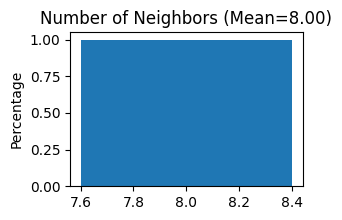

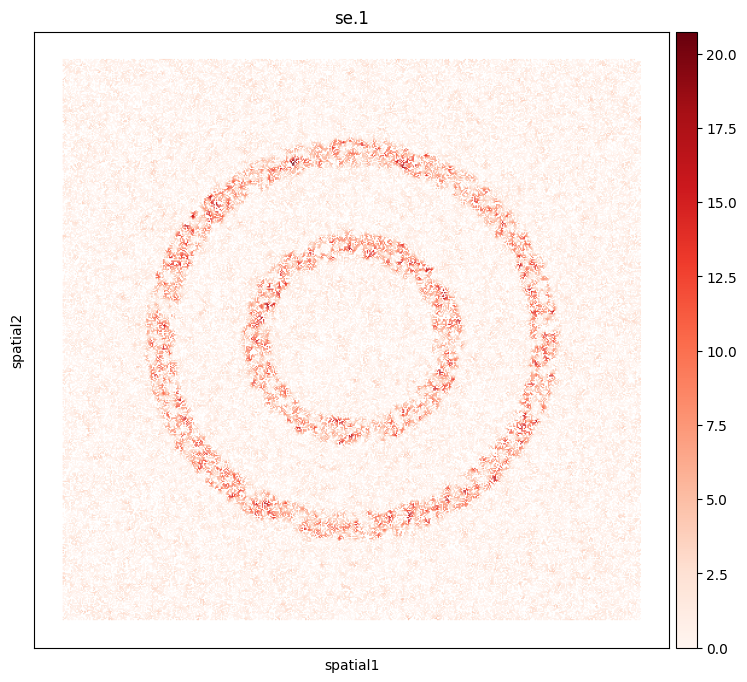

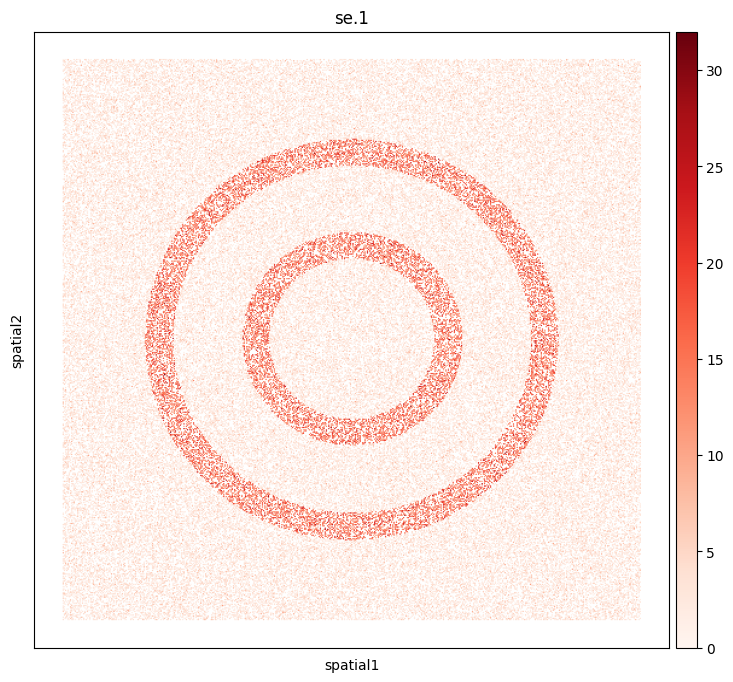

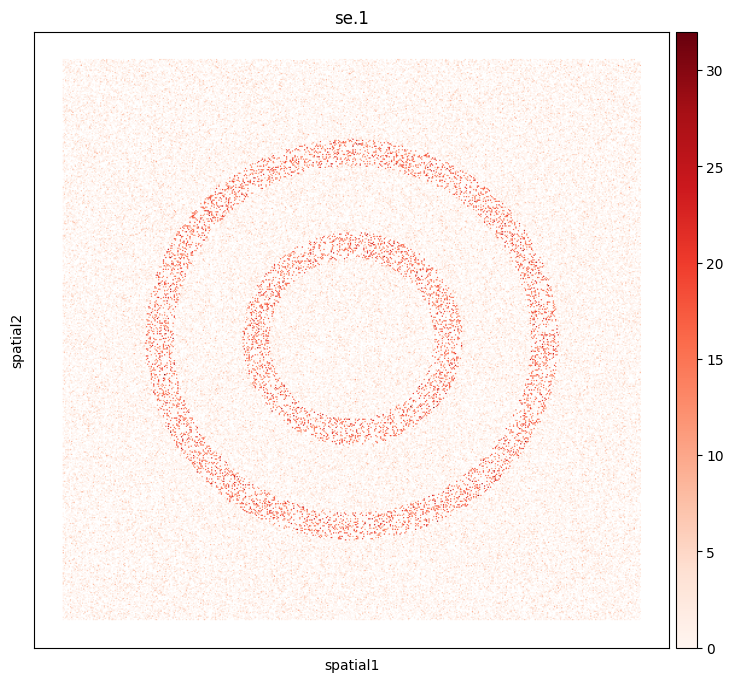

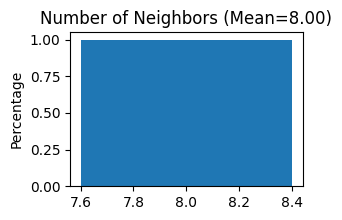

...

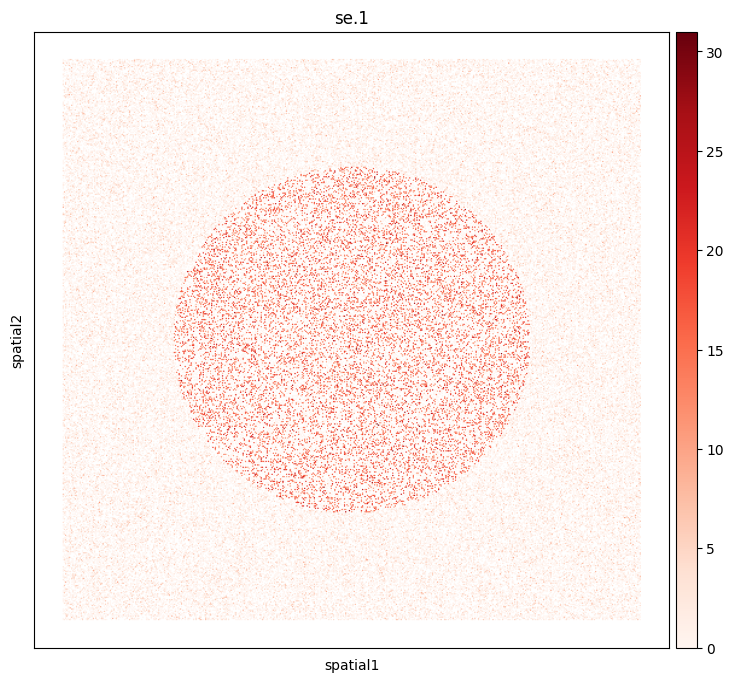

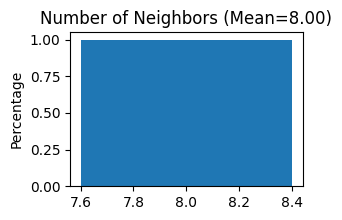

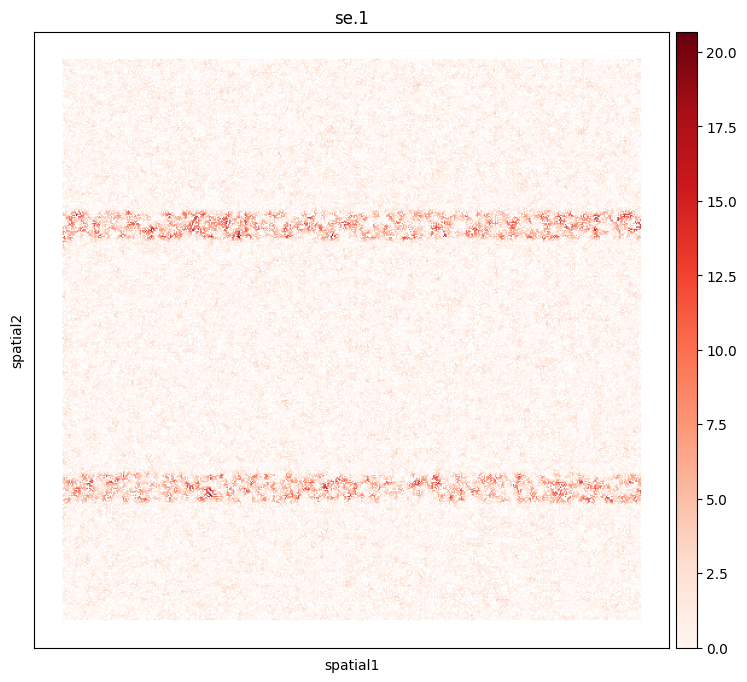

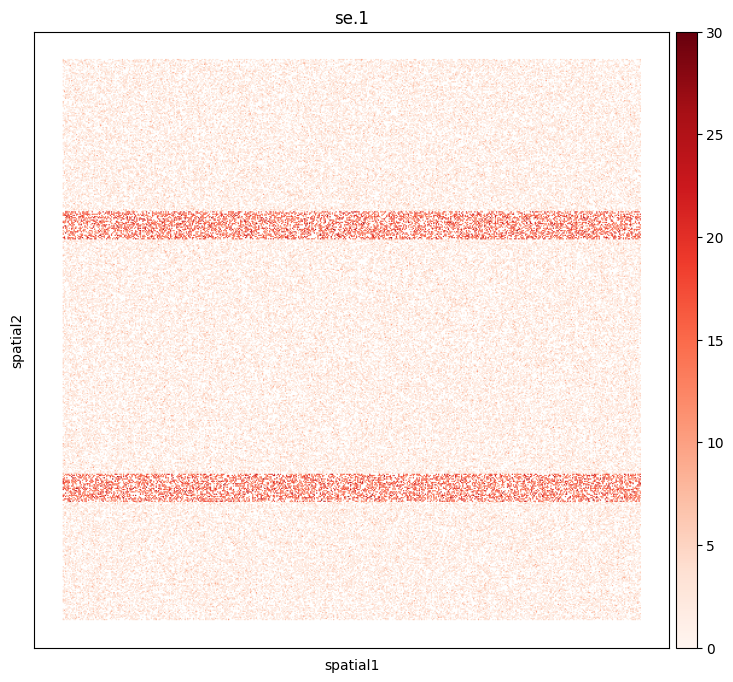

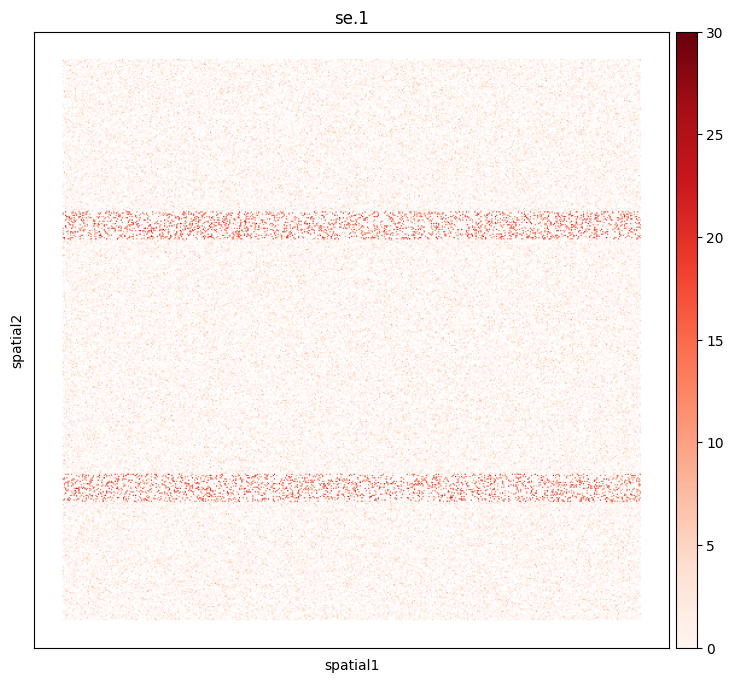

In [6]:
dist_mapping={'0':'ZIP','1':'ZINB'}
dist = dist_mapping['0']
patterns = [f for f in os.listdir('.') if f.endswith('.png')]
device= torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
for ptn in patterns:
    res_dir = ptn.split('.')[0]
    print(f'================================== pattern:{res_dir}  ===================================')
    res_dir = f'{dist}/{res_dir}'
    if not os.path.exists(res_dir):
        os.makedirs(res_dir)
    current_img_dir = '.' 
    if dist=='ZINB':
        adata = HERGAST.utils.simulate_gene(spots=160000,type='ZINB',ptn=ptn,png_dir=current_img_dir, se_mu=20,se_size=20,ns_mu=2,ns_size=2,se_p=0.01,ns_p=0.01)
        adata.layers['gt'] = adata.X.copy()
    elif dist=='ZIP':
        adata = HERGAST.utils.simulate_gene(spots=160000,type='ZIP',ptn=ptn,png_dir=current_img_dir, se_mu=15,ns_mu=3,se_p=0.01,ns_p=0.01)
        adata.layers['gt'] = adata.X.copy()
        
    #60% entries held-out cells
    HELDOUT_RATIO = 0.60  
    rng = np.random.default_rng(7)
    N = adata.shape[0]
    cell_mask = rng.random(N) < HELDOUT_RATIO   # (N,)
    mask = np.broadcast_to(cell_mask[:, None], adata.shape)  # (cells, genes)
    adata.obs['mask'] = cell_mask
    adata.layers['mask'] = mask
    
    adata.layers['input_masked'] = adata.layers['gt'].copy()
    adata.layers['input_masked'][mask] = 0.0
    adata.X = adata.layers['input_masked'].copy()
    
    mask = adata.layers['mask'][:, :50]


    #STAGATE model
    STAGATE_pyG.Cal_Spatial_Net(adata, k_cutoff=8,model='KNN')
    STAGATE_pyG.Stats_Spatial_Net(adata)
    adata = STAGATE_pyG.train_STAGATE(adata, device = device,save_reconstrction=True)
    
    #Evaluation
    adata.layers['rex'] = adata.layers['STAGATE_ReX']
    adata.layers['gt_norm'] = min_max_norm(adata.layers['gt'])
    adata.layers['rex_norm'] = min_max_norm(adata.layers['rex'])
    adata.layers['input_masked_norm'] = min_max_norm(adata.layers['input_masked'])

    gt_data = adata.layers['gt'][:, :50]
    rex_data = adata.layers['rex'][:, :50]
    input_masked_data = adata.layers['input_masked'][:, :50]
    
    gt_norm_data = adata.layers['gt_norm'][:, :50]
    rex_norm_data = adata.layers['rex_norm'][:, :50]
    input_masked_norm_data = adata.layers['input_masked_norm'][:, :50]
    

    # Held-out region Reconstructed (Rex) vs Ground Truth
    gt_data_mask=gt_data[mask]
    rex_data_mask=rex_data[mask]
    input_masked_data_mask=input_masked_data[mask]

    gt_norm_data_mask = gt_norm_data[mask]
    rex_norm_data_mask = rex_norm_data[mask]
    input_masked_norm_data_mask = input_masked_norm_data[mask]


    rex_pcc_mask, rex_spcc_mask,pcc_per_gene_mask, spcc_per_gene_mask = compute_all_metrics(gt_data_mask, rex_data_mask)
    noise_pcc_mask, noise_spcc_mask,noise_pcc_per_gene_mask,noise_spcc_per_gene_mask = compute_all_metrics(rex_data_mask, input_masked_data_mask)
    
    rmse_mask, mae_mask, rmse_per_gene_mask, mae_per_gene_mask=error_metrics(gt_norm_data_mask,rex_norm_data_mask)
    noise_rmse_mask, noise_mae_mask, noise_rmse_per_gene_mask, noise_mae_per_gene_mask=error_metrics(gt_norm_data_mask,input_masked_norm_data_mask)

    rex_df = pd.DataFrame({"Methods": ["STAGATE"] * 50,"Gene": adata.var_names[:50],"PCC": pcc_per_gene_mask,"SPCC": spcc_per_gene_mask,"RMSE":rmse_per_gene_mask,"MAE":mae_per_gene_mask,"pattern":res_dir,'Held-out':'60%'},)
    
    # Noise vs GT
    noise_df = pd.DataFrame({"Methods": ["Mask"] * 50,"Gene": adata.var_names[:50],"PCC": noise_pcc_per_gene_mask,"SPCC": noise_spcc_per_gene_mask,"RMSE":noise_rmse_per_gene_mask,"MAE":noise_mae_per_gene_mask,"pattern":res_dir,'Held-out':'60%'})
    
    rex_df.to_csv(f"{res_dir}/STAGATE_0.6_rex_vs_gt_correlation.csv", index=False)
    noise_df.to_csv(f"{res_dir}/mask_0.6_vs_gt_correlation.csv", index=False)
    
    print(f"\n{'Metric':<10} | {'mask_region_Reconstructed (STAGATE)':<22} | {'mask_region Input':<22}")
    print("-" * 60)
    print(f"{'mask_region_PCC':<10} | {rex_pcc_mask:.4f}{' (Higher is better)':<22} | {noise_pcc_mask:.4f}")
    print(f"{'mask_region_SPCC':<10} | {rex_spcc_mask:.4f}{' (Higher is better)':<22} | {noise_spcc_mask:.4f}")
    print(f"{'mask_region_RMSE':<10} | {rmse_mask:.4f}{' (Lower is better)':<22} | {noise_rmse_mask:.4f}")
    print(f"{'mask_region_MAE':<10} | {mae_mask:.4f}{' (Lower is better)':<22} | {noise_mae_mask:.4f}")

    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='rex',show=False,size=4)
    plt.savefig(f'{res_dir}/STAGATE_0.6_svg_sp_rex.png')
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='gt',show=False,size=4)
    plt.savefig(f'{res_dir}/0.6_svg_sp_gt.png')
    sc.pl.embedding(adata,basis='spatial',color=f'se.1',cmap='Reds',layer='input_masked',show=False,size=4)
    plt.savefig(f'{res_dir}/0.6_svg_sp_input_masked.png')

    